In [1]:
from typing import List, Union
import warnings

import os
os.environ["TOKENIZERS_PARALLELISM"] = "true"

from pathlib import Path
PROJ_DIR = Path.cwd().parent
DATA_DIR = PROJ_DIR / "data"
MDLS_DIR = PROJ_DIR / "models"
PICS_DIR = PROJ_DIR / "pictures"

import sys
sys.path.append(str(PROJ_DIR))

import tqdm
import pprint

import json
import numpy as np
import pandas as pd
MAX_N_TOKENS = 64
MIN_N_TOKENS = 4

from sentence_transformers import SentenceTransformer
from sentence_transformers.models import Pooling, WordEmbeddings

# Uncomment to download stopwords and wordnet
#   import nltk
#   nltk.download('stopwords')
#   nltk.download('wordnet')
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

import gensim
from gensim.utils import simple_preprocess

from top2vec import Top2Vec

from wordcloud import WordCloud
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import top_k_accuracy_score

from scipy.special import softmax


class G:
    """Global variables"""

    lemmatizer = WordNetLemmatizer()
    stopwords  = set(stopwords.words("english")) | \
                    {"may", "could", "result", "mine", "coal", "finance", 
                        "price", "risk", "u", "company", "result", 
                        "financial", "mineral", "adverse", "adversely", 
                        "affect", "effect", "include"}


def lemmatize_single(token: str) -> str:
    """Lemmatize the given token. Try all possible 
        lemmatization (n, v, a, r, s) until the input changes."""
        
    all_pos = ["n", "v", "a", "r", "s"]

    ret = token
    while (ret == token) and all_pos:
        ret = G.lemmatizer.lemmatize(token, all_pos.pop(0))
    return ret


def keep_token(token: str) -> bool:
    """Check if the given token is a valid word."""
    
    return token not in G.stopwords


def gensim_tokenize_single(text: str, is_lemma: bool = True) -> List[str]:
    """Tokenize the given text using gensim's 
        simple_preprocess. Punctuations and stopwords
        are removed, and the tokens are lemmatized."""
    
    fn_lemma = lemmatize_single if is_lemma else lambda x: x
    ret = [fn_lemma(t) for t in simple_preprocess(text, min_len=3)]
    return [t for t in ret if keep_token(t)]

## __Data Processing and EDA__

100%|██████████| 31171/31171 [00:01<00:00, 23552.14it/s]


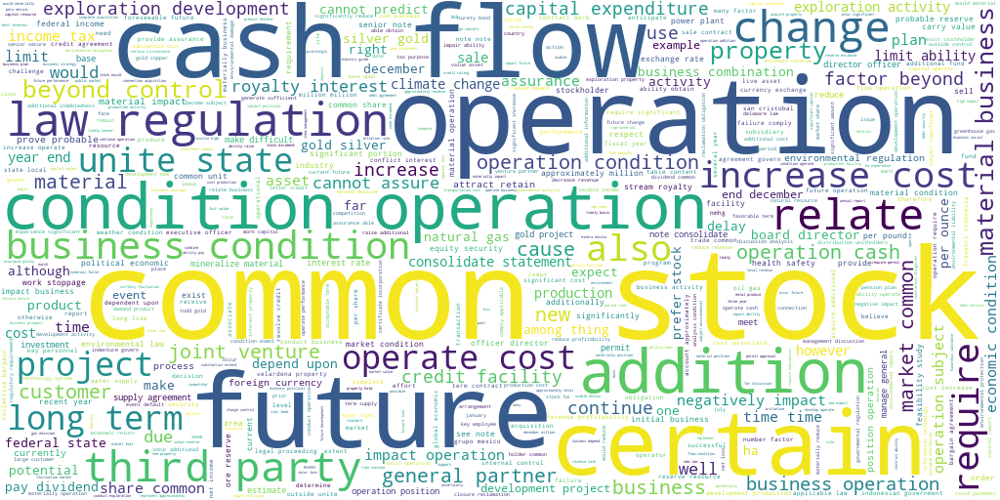

In [2]:
# Load extracted Item 1A
#   - Preprocess the risk statements with `gensim_tokenize_single`
with open(DATA_DIR / "extracts" / "item1a-full-scored.json") as f:
    item = pd.DataFrame(json.load(f)).loc[:, ["symbol", "filing_time", "item1a"]]
    
    # Ad-hoc fix for "hl, 2012-02". Since the filing does not 
    #   have any new-line characters, the paragraph splitting
    #   strategy failed.
    item = item.set_index(["symbol", "filing_time"])
    item.loc[("hl", "2012-02"), "item1a"] = \
        item.loc[("hl", "2012-02"), "item1a"][0].split(". ")
    item = item.reset_index()
   
    item = item.explode("item1a") \
            .assign(item1a_tokenized=lambda x: x.item1a.apply(gensim_tokenize_single))
    
    docs = set()
    for _, r in tqdm.tqdm(item.iterrows(), total=len(item)):
        if MIN_N_TOKENS < len(r["item1a_tokenized"]) < MAX_N_TOKENS:
            docs.add((r["item1a"], " ".join(r["item1a_tokenized"])))
    docs = list(docs)

# Quick visualization of common words
warnings.filterwarnings(action="ignore", category=DeprecationWarning)
WordCloud(background_color="white", 
          max_words=512, 
          stopwords=G.stopwords,
          contour_width=3, 
          contour_color="steelblue",
          width=1024, height=512) \
    .generate(" ".join(d[1] for d in docs)) \
    .to_image()

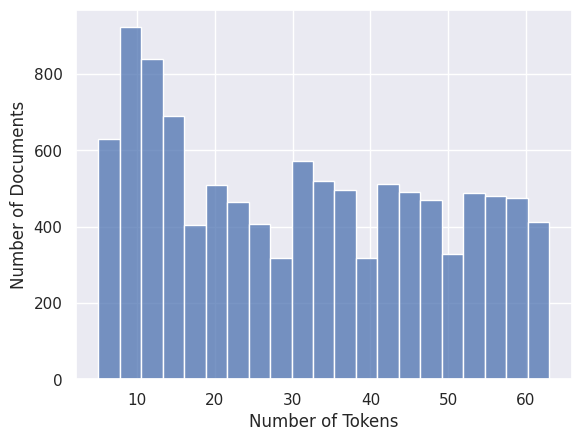

In [3]:
ax = sns.histplot([len(d[1].split()) for d in docs], kde=False)
_  = ax.set(xlabel="Number of Tokens", ylabel="Number of Documents")

## __`Top2Vec` Modeling__

In [10]:
# model_t2v = Top2Vec([d[1] for d in docs], embedding_model="doc2vec", speed="deep-learn")
# model_t2v.save(MDLS_DIR / "top2vec" / "doc2vec-deep-learn-16-topics.pkl")
model_t2v = Top2Vec.load(MDLS_DIR / "top2vec" / "doc2vec-deep-learn-16-topics.pkl")

In [11]:
topic_words, word_scores, topic_nums = model_t2v.get_topics()
print("Number of topics:", len(topic_words))

Number of topics: 144


In [12]:
topic_nums_max = 16
topic_groups = model_t2v.hierarchical_topic_reduction(topic_nums_max)
topic_groups

[[79, 48, 36, 111, 8, 118, 137, 30, 62, 37, 116, 81, 82, 78, 17],
 [83, 5, 85, 127, 22, 97, 128, 125, 95, 106, 141, 27],
 [109, 12, 50, 54, 136, 0],
 [132, 56, 104, 124, 69, 120, 102, 35, 74, 135, 87, 98, 73, 53, 113, 66],
 [142, 57, 46, 90, 143, 18, 72, 43, 121, 110, 51, 44, 93, 100, 21],
 [88, 7, 52, 33, 39, 68, 70, 119, 38],
 [134, 19, 11, 45, 99, 20, 23, 117, 126, 60],
 [77, 61, 96, 76, 49, 108, 112, 86, 71, 1],
 [47, 140, 9, 67, 2],
 [13, 75, 114, 32, 14, 94, 91, 89, 58],
 [103, 107, 40, 4, 131, 26],
 [16, 84, 122, 28, 25, 29],
 [34, 105, 138, 31, 65, 101, 130, 80, 59, 123, 15],
 [3, 139, 6],
 [63, 92, 41, 129, 64, 115, 42],
 [10, 55, 133, 24]]

In [5]:
warnings.filterwarnings(action="ignore", category=DeprecationWarning)
for i, g in enumerate(topic_groups):
    os.mkdir(PICS_DIR / "topics" / "doc2vec" / f"topic-reduced-{i}")
    
    # Save reduced topic
    model_t2v.generate_topic_wordcloud(i, "white", reduced=True)
    plt.savefig(PICS_DIR / "topics" / "doc2vec" / f"topic-reduced-{i}.jpg", bbox_inches="tight")
    plt.close()
    
    # Save fine grained topics group by the reduced topic
    for j in g:
        model_t2v.generate_topic_wordcloud(j, "white", reduced=False)
        plt.savefig(PICS_DIR / "topics" / "doc2vec" / f"topic-reduced-{i}" / f"topic_{j}.jpg", bbox_inches="tight")
        plt.close()

warnings.filterwarnings(action="ignore", category=DeprecationWarning)
for i in range(topic_nums_max):
    model_t2v.generate_topic_wordcloud(i, "white", reduced=True)

In [93]:
# Save the topic keywords
ret = {}
for i in range(len(topic_words)):
    ret[f"topic_{i}"] = {w: round(float(s), 4) for w, s in zip(topic_words[i], word_scores[i])}
    
with open(DATA_DIR / "topics" / "doc2vec-deep-learn-all-topics.json", "w") as f:
    json.dump(ret, f, indent=True)
    
pd.DataFrame({t: list(ws.keys()) for t, ws in ret.items()}) \
    .to_csv(DATA_DIR / "topics" / "doc2vec-deep-learn-all-topics.csv", index=False)
    
# Collect topic keywords for each group and save groups
ret = {}
for i in range(len(model_t2v.topic_words_reduced)):
    z = zip(model_t2v.topic_words_reduced[i], model_t2v.topic_word_scores_reduced[i])
    ret[f"topic_reduced_{i}"] = {w: round(float(s), 4) for w, s in z}

with open(DATA_DIR / "topics" / f"doc2vec-deep-learn-{topic_nums_max}-topics.json", "w") as f:
    json.dump(ret, f, indent=True)
    
pd.DataFrame({t: list(ws.keys()) for t, ws in ret.items()}) \
    .to_csv(DATA_DIR / "topics" / f"doc2vec-deep-learn-{topic_nums_max}-topics.csv", index=False)

## __Cluster Attribution__

### __Tf-idf Similarity__

In [7]:
def make_predictor(vectorizer: TfidfVectorizer, table):
    """Given a tf-idf vectorizer and a tf-idf table, 
        construct a cluster attributor that predict the
        cluster belonging of a given text."""
    
    def predictor(s: str, return_scores: bool = False) -> Union[int, np.ndarray]:
        
        v = vectorizer.transform([s])
        s = cosine_similarity(v, table).flatten()
        if return_scores:
            return softmax(s / 0.1)
        return s.argmax()

    return predictor


# Collect topic keywords for each reduced topic
tfidf_vec = TfidfVectorizer(tokenizer=gensim_tokenize_single)
tfidf_tbl = tfidf_vec.fit_transform([" ".join(t) for t in model_t2v.topic_words_reduced.tolist()])
tfidf_prd = make_predictor(tfidf_vec, tfidf_tbl)

In [8]:
topic_attribution = []
for i, d in tqdm.tqdm(enumerate(model_t2v.documents)):
    
    # Get tfidf-based attribution
    tfidf_scr = tfidf_prd(d, return_scores=True)
    tfidf_idx = tfidf_scr.argmax()
    
    # Get cosine-based attribution
    ci, cs, ck, _ = model_t2v.get_documents_topics([i], reduced=True)
    
    # Append prediction
    topic_attribution.append({
        "tfidf_scores": tfidf_scr,
        "tfidf_attr": tfidf_idx,
        "tfidf_topic_keywords": " ".join(model_t2v.topic_words_reduced[tfidf_idx][:8]),
        "cosine_confidence": cs[0],
        "cosine_attr": ci[0],
        "cosine_topic_keywords": " ".join(ck.tolist()[0][:8]),
        "doc": d,
    })

# Convert tof pd.DataFrame
topic_attribution = pd.DataFrame(topic_attribution)
topic_attribution.head()

9173it [00:12, 737.16it/s]


,tfidf_scores,tfidf_attr,tfidf_topic_keywords,cosine_confidence,cosine_attr,cosine_topic_keywords,doc
0,"[0.03620505899707232, 0.07228598945951772, 0.0...",7,estimate mineralization reserve feasibility pr...,0.415843,7,estimate mineralization reserve feasibility pr...,estimate relate new development project gold b...
1,"[0.026560155801363325, 0.03774459365596961, 0....",12,carbon emission gas greenhouse fuel electricit...,0.439669,12,carbon emission gas greenhouse fuel electricit...,nacoals consolidate operation subject associat...
2,"[0.06740608965629877, 0.025376369054357997, 0....",10,impairment live ounce decline pound molybdenum...,0.545942,10,impairment live ounce decline pound molybdenum...,extend decline market copper gold molybdenum e...
3,"[0.04075391188101388, 0.04075391188101388, 0.1...",2,regulation stringent environmental law hazardo...,0.415552,2,regulation stringent environmental law hazardo...,property subject foreign environmental law reg...
4,"[0.14025842226703963, 0.0511775883903732, 0.05...",15,irs income taxable immaterial tax presently ca...,0.215510,9,flood hazard damage occurrence accident injury...,increasingly require consider provide benefit ...


In [9]:
topic_attribution_wrong = topic_attribution[topic_attribution.apply(lambda r: r["tfidf_attr"] != r["cosine_attr"], axis=1)]
(topic_attribution_wrong.groupby("cosine_attr").size() / topic_attribution_wrong.shape[0]).sort_values(ascending=False)

cosine_attr
1     0.111919
6     0.099394
14    0.075152
13    0.069495
11    0.068283
4     0.062222
0     0.058182
7     0.057778
2     0.056970
9     0.056162
8     0.055354
5     0.052525
10    0.047677
12    0.045253
15    0.045253
3     0.038384
dtype: float64

In [10]:
top_k_accuracy_score(topic_attribution["cosine_attr"], 
                     topic_attribution["tfidf_scores"].values.tolist(),  
                     sample_weight=topic_attribution["cosine_confidence"],
                     k=3)

0.945159359182942

In [8]:
item["cluster"] = item["item1a"].map(lambda s: tfidf_prd(s))
item["cluster_keywords"] = item["cluster"].map(lambda i: " ".join(model_t2v.topic_words_reduced[i][:8]))
item.head(10)

,symbol,filing_time,item1a,item1a_tokenized,cluster,cluster_keywords
0,abml,2013-12,The Risk Factors below are provided for a pote...,"[factor, provide, potential, investor, informa...",3,stock common share convertible delist dilution...
0,abml,2013-12,Risks Factors Which May Effect Our Business Be...,"[factor, business, auditor, issue, go, concern...",1,ever discover guide positive reserve feasibili...
0,abml,2013-12,"Our auditors' report December 24, 2013 on our ...","[auditor, report, december, statement, form, e...",1,ever discover guide positive reserve feasibili...
0,abml,2013-12,Since mineral exploration is a highly speculat...,"[since, exploration, highly, speculative, vent...",6,director incorporation stockholder certificate...
0,abml,2013-12,Potential investors should be aware of the dif...,"[potential, investor, aware, difficulty, norma...",1,ever discover guide positive reserve feasibili...
0,abml,2013-12,If we don't obtain additional financing our bu...,"[obtain, additional, business, fail]",1,ever discover guide positive reserve feasibili...
0,abml,2013-12,"Our cash as of September 30, 2013 is not estim...","[cash, september, estimate, sufficient, comple...",1,ever discover guide positive reserve feasibili...
0,abml,2013-12,Obtaining additional financing will depend on ...,"[obtain, additional, depend, number, factor, m...",1,ever discover guide positive reserve feasibili...
0,abml,2013-12,It is impossible to evaluate the investment me...,"[impossible, evaluate, investment, merit, oper...",1,ever discover guide positive reserve feasibili...
0,abml,2013-12,We are an exploration stage company with no op...,"[exploration, stage, operate, history, upon, e...",1,ever discover guide positive reserve feasibili...


In [16]:
# Convert topic assignment to long format 
#   with pivot table; count number of clusters
df_topic_dist = item.loc[item["item1a_tokenized"].map(lambda ts: MIN_N_TOKENS < len(ts) < MAX_N_TOKENS)] \
                    .groupby(["symbol", "filing_time"])["cluster"] \
                    .value_counts(normalize=True) \
                    .unstack() \
                    .fillna(0) \
                    .add_prefix("topic_reduced_")
df_topic_dist.head()

# Join with previous keywords counting statistics
# df_topic_dist["total_short_paragraphs"] = df_topic_dist.sum(axis=1)
# df_uniqueness = pd.read_excel(DATA_DIR / "statistics" / "uniqueness.xlsx")
# df_uniqueness = pd.merge(df_uniqueness, df_topic_dist.reset_index(), on=["symbol", "filing_time"], how="left")
# df_uniqueness.to_excel(DATA_DIR / "statistics" / "uniqueness-w-topics.xlsx", index=False)

cluster             topic_reduced_0  topic_reduced_1  topic_reduced_2  \
symbol filing_time                                                      
abml   2013-12                0.000         0.302326            0.000   
       2015-01                0.000         0.310345            0.000   
       2015-12                0.000         0.000000            0.000   
       2016-12                0.000         0.000000            0.000   
amr    2019-04                0.128         0.040000            0.152   

cluster             topic_reduced_3  topic_reduced_4  topic_reduced_5  \
symbol filing_time                                                      
abml   2013-12             0.255814            0.000         0.046512   
       2015-01             0.310345            0.000         0.000000   
       2015-12             0.000000            0.000         0.000000   
       2016-12             0.000000            0.000         0.000000   
amr    2019-04             0.064000            0.136         0.024000   

cluster             topic_reduced_6  topic_reduced_7  topic_reduced_8  \
symbol filing_time                                                      
abml   2013-12             0.116279         0.023256         0.069767   
       2015-01             0.137931         0.000000         0.034483   
       2015-12             0.000000         0.000000         0.000000   
       2016-12             0.000000         0.000000         0.000000   
amr    2019-04             0.040000         0.040000         0.048000   

cluster             topic_reduced_9  topic_reduced_10  topic_reduced_11  \
symbol filing_time                                                        
abml   2013-12             0.069767              0.00          0.046512   
       2015-01             0.103448              0.00          0.068966   
       2015-12             0.000000              0.00          0.000000   
       2016-12             0.000000              0.00          0.000000   
amr    2019-04             0.072000              0.04          0.000000   

cluster             topic_reduced_12  topic_reduced_13  topic_reduced_14  \
symbol filing_time                                                         
abml   2013-12              0.023256              0.00          0.023256   
       2015-01              0.000000              0.00          0.000000   
       2015-12              0.000000              0.00          0.000000   
       2016-12              0.000000              0.00          0.000000   
amr    2019-04              0.080000              0.04          0.032000   

cluster             topic_reduced_15  
symbol filing_time                    
abml   2013-12              0.023256  
       2015-01              0.034483  
       2015-12              1.000000  
       2016-12              1.000000  
amr    2019-04              0.064000

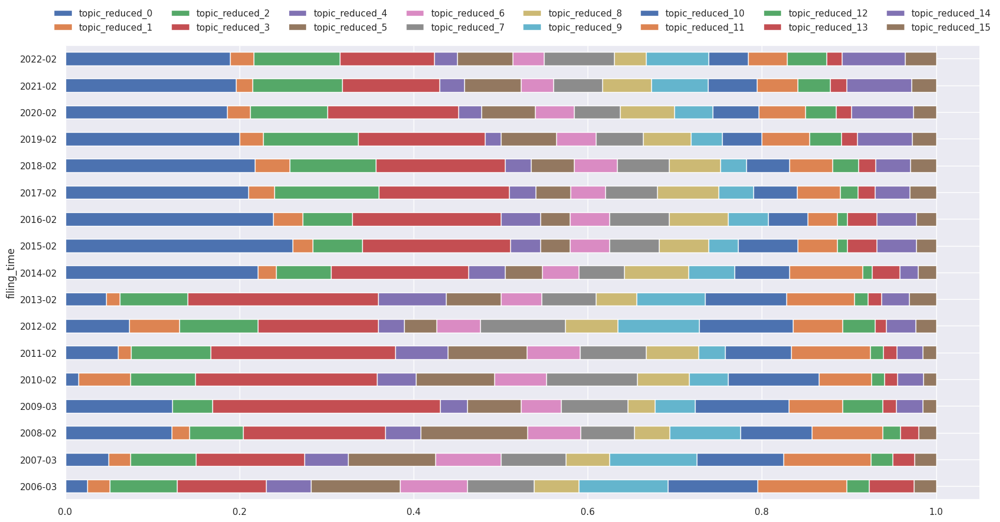

In [17]:
df_topic_dist.loc["hl"].plot.barh(stacked=True, figsize=(20, 10))
plt.legend(bbox_to_anchor=(0.5, 1.02),
           loc="lower center",
           borderaxespad=0,
           frameon=False,
           ncol=8)

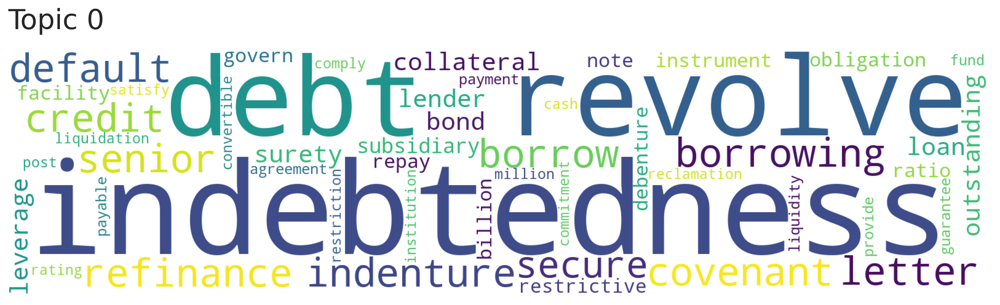

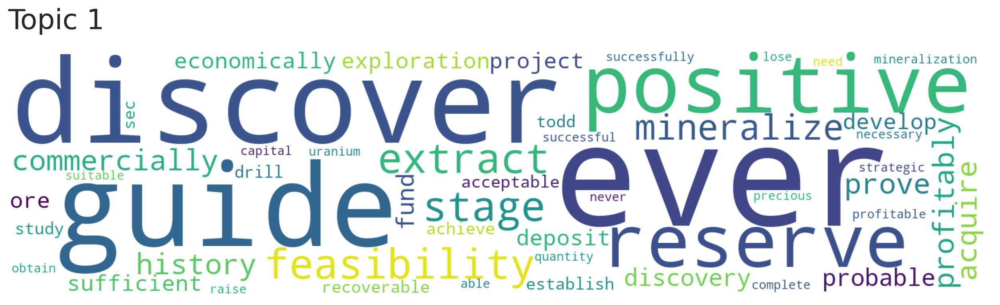

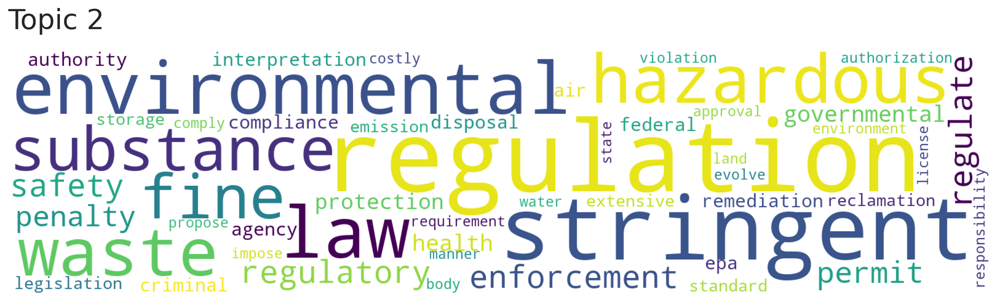

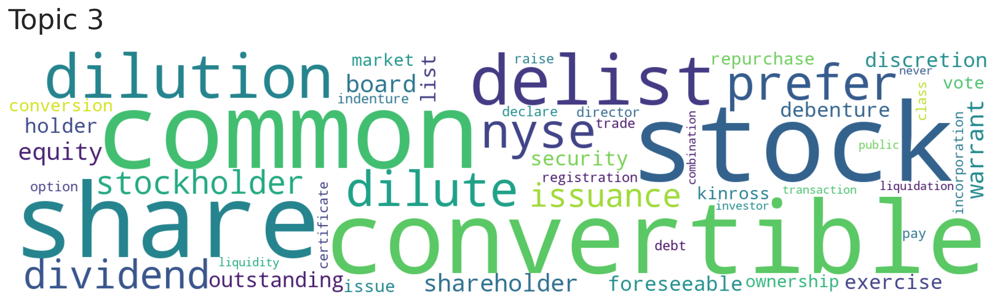

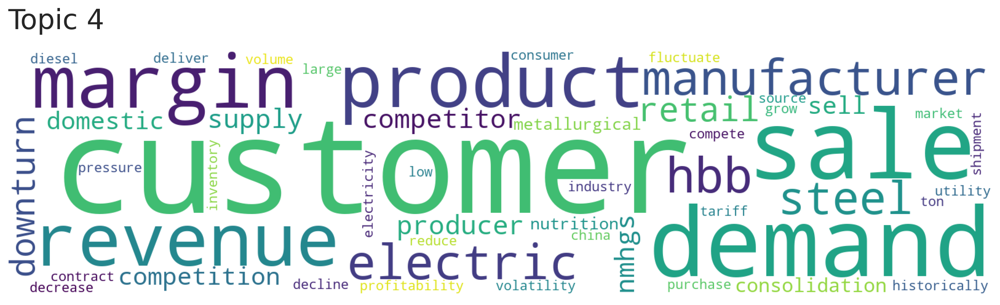

...

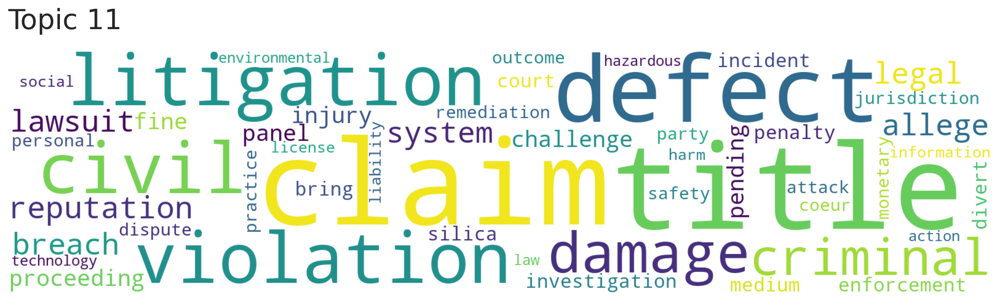

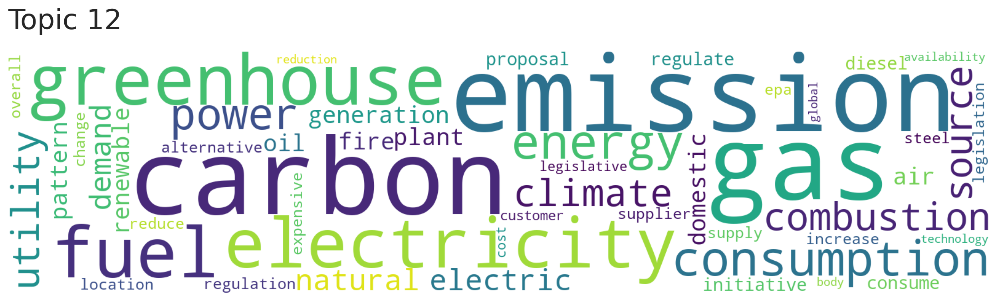

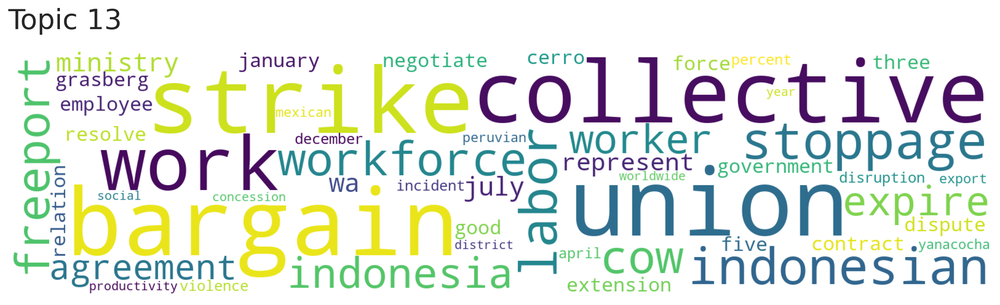

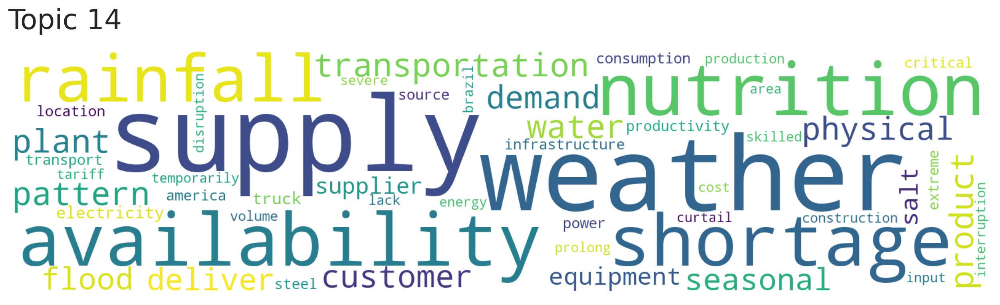

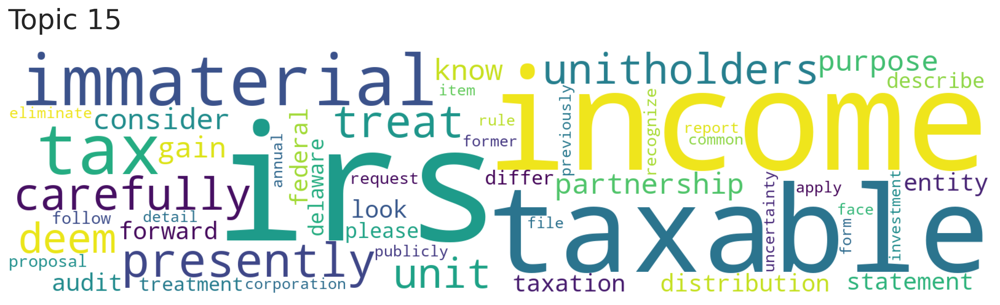

In [100]:
for i in range(16):
    model_t2v.generate_topic_wordcloud(i, "white", reduced=True)